# Solar Panel Efficiency Prediction

**Solar Panel Efficiency Prediction using Weather and Air Quality Data**

This script performs an exploratory data analysis on weather and air quality datasets to predict solar panel efficiency. The script includes data loading, cleaning, feature engineering, and visualization steps to prepare for machine learning model building.


## Objectives

Develop models that classify solar panel efficiency as **‘Low’**, **‘Medium’**, or **‘High’**. By leveraging historical same day forecasted weather data, implement predictive algorithms that identify and learn from patterns associated with varying efficiency levels.

## Exploratory Data Analysis (EDA)

#### Dataset

The two dataset provided (weather & air quality) contains information forecasted weather data compiled from various meteorological agencies and air quality data.

#### Loading Libraries for Exploratory Data Analysis

In [1]:
import numpy as np  # For numerical operations
import pandas as pd  # For data manipulation and analysis
import matplotlib.pyplot as plt  # For plotting graphs
import seaborn as sns  # For advanced visualizations
import sqlite3  # For SQL database management
import requests  # For making HTTP requests to download data
import io  # For handling byte streams
from datetime import datetime  # For handling date and time objects
import calendar  # For calendar operations like getting days in a month
from sklearn.preprocessing import OrdinalEncoder  # For encoding categorical features
from sklearn.model_selection import train_test_split  # For splitting datasets into training and test sets
import matplotlib.dates as mdates  # For formatting date labels in plots


import warnings
# Ignore all warnings
warnings.filterwarnings('ignore')

%matplotlib inline

### Loading and Reviewing the Datasets


In [ ]:
# Path to dataset
url1 = './data/weather.db'
url2 = './air_quality.db'

# Load weather data from a SQLite database obtained from the provided URL
response = requests.get(url1)
if response.status_code == 200:
  # Create a temporary file to store the database
  with open('weather.db', 'wb') as temp_file:
    temp_file.write(response.content)

  # Connect to the temporary database file
  conn = sqlite3.connect('weather.db')
  query = "SELECT * FROM weather"
  weather_data = pd.read_sql_query(query, conn, index_col = 'data_ref')
  conn.close()


# Load air_quality data from SQL database from the URL
response = requests.get(url2)
if response.status_code == 200:
  # Create a temporary file to store the database
  with open('air_quality.db', 'wb') as temp_file:
    temp_file.write(response.content)

  # Connect to the temporary database file
  conn = sqlite3.connect('air_quality.db')
  query = "SELECT * FROM air_quality"
  air_quality_data = pd.read_sql_query(query, conn, index_col = 'data_ref')
  conn.close()

In [3]:
# View weather data
weather_data.head()

,date,Daily Rainfall Total (mm),Highest 30 Min Rainfall (mm),Highest 60 Min Rainfall (mm),Highest 120 Min Rainfall (mm),Min Temperature (deg C),Maximum Temperature (deg C),Min Wind Speed (km/h),Max Wind Speed (km/h),Sunshine Duration (hrs),Cloud Cover (%),Wet Bulb Temperature (deg F),Relative Humidity (%),Air Pressure (hPa),Dew Point Category,Wind Direction,Daily Solar Panel Efficiency
data_ref,,,,,,,,,,,,,,,,,
4d4d20c2-0167-4bc2-a62c-4df6e11fb2ea,01/04/2014,-,2,2,2,28.4,32.4,7.5,25.9,8.07,18.0,-59.3,100.0,1006,VH,W,High
c9d3c825-fd94-4e61-a4bc-2cf0f2208de0,02/04/2014,0,0,0,--,28.8,32.6,--,33.1,7.57,23.0,59.2,100.0,1005,Very High,S,Medium
6d445ffb-d4c2-4f94-a27e-224fabe46d10,03/04/2014,0,0,0,0,29.3,--,--,43.2,6.72,16.0,59.7,98.5,1005,Low,E,Medium
7a404c50-710f-451a-9a42-a66bb783a3d0,04/04/2014,0,0,0,0,28.6,32.4,7.4,33.1,7.55,20.0,59.1,100.0,1011,Very High,W,Medium
0d3194a7-ad1a-456e-9bf8-b1bae730977b,05/04/2014,23.4,15.2,17.2,17.4,26.4,28,5.4,28.1,5.27,74.0,58.9,100.0,1012,Very High,east,Low


In [4]:
# Reviewing weather data columns against the data dictionary
# to develop a preli,inary understanding of the data and
# note the columns with missing va;ues.
weather_data.info()

# Count of missing values for variables with missing values
for col in weather_data.columns:
  if weather_data[col].isnull().sum() > 0:
    print(f'{col} has {weather_data[col].isnull().sum()} missing values')

<class 'pandas.core.frame.DataFrame'>
Index: 3517 entries, 4d4d20c2-0167-4bc2-a62c-4df6e11fb2ea to c3a06585-7b5e-41e6-8926-f5291bd8e1c6
Data columns (total 17 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   date                           3517 non-null   object 
 1   Daily Rainfall Total (mm)      3517 non-null   object 
 2   Highest 30 Min Rainfall (mm)   3517 non-null   object 
 3   Highest 60 Min Rainfall (mm)   3517 non-null   object 
 4   Highest 120 Min Rainfall (mm)  3517 non-null   object 
 5   Min Temperature (deg C)        3517 non-null   object 
 6   Maximum Temperature (deg C)    3517 non-null   object 
 7   Min Wind Speed (km/h)          3517 non-null   object 
 8   Max Wind Speed (km/h)          3502 non-null   object 
 9   Sunshine Duration (hrs)        3501 non-null   float64
 10  Cloud Cover (%)                3501 non-null   float64
 11  Wet Bulb Temperature (deg F)   3517 non-null  

In [5]:
# View air_quality data
air_quality_data.head()

,date,pm25_north,pm25_south,pm25_east,pm25_west,pm25_central,psi_north,psi_south,psi_east,psi_west,psi_central
data_ref,,,,,,,,,,,
4d4d20c2-0167-4bc2-a62c-4df6e11fb2ea,01/04/2014,20,16,18,23,19,58,56,57,66,59
c9d3c825-fd94-4e61-a4bc-2cf0f2208de0,02/04/2014,18,14,-,22,16,57,53,54,61,56
6d445ffb-d4c2-4f94-a27e-224fabe46d10,03/04/2014,12,12,10,14,10,55,53,52,59,54
7a404c50-710f-451a-9a42-a66bb783a3d0,04/04/2014,--,-,24,19,25,58,57,55,-,56
0d3194a7-ad1a-456e-9bf8-b1bae730977b,05/04/2014,18,19,21,13,17,64,64,66,-,66


In [6]:
# Reviewing weather data columns against the data dictionary
# to develop a preli,inary understanding of the data and
# note the columns with missing va;ues.
air_quality_data.info()

# Count of missing values for variables with missing values
for col in air_quality_data.columns:
  if air_quality_data[col].isnull().sum() > 0:
    print(f'{col} has {air_quality_data[col].isnull().sum()} missing values')

<class 'pandas.core.frame.DataFrame'>
Index: 3875 entries, 4d4d20c2-0167-4bc2-a62c-4df6e11fb2ea to 2d850015-fbac-4a9b-b1d1-8f4925a7ee5b
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   date          3875 non-null   object
 1   pm25_north    3836 non-null   object
 2   pm25_south    3836 non-null   object
 3   pm25_east     3836 non-null   object
 4   pm25_west     3836 non-null   object
 5   pm25_central  3836 non-null   object
 6   psi_north     3836 non-null   object
 7   psi_south     3836 non-null   object
 8   psi_east      3836 non-null   object
 9   psi_west      3836 non-null   object
 10  psi_central   3836 non-null   object
dtypes: object(11)
memory usage: 363.3+ KB
pm25_north has 39 missing values
pm25_south has 39 missing values
pm25_east has 39 missing values
pm25_west has 39 missing values
pm25_central has 39 missing values
psi_north has 39 missing values
psi_south has 39 missing values
psi_east has 

In [7]:
# Check for duplicate in the 'date' columns
print(f'Number of duplicate rows in weather_data: {weather_data.duplicated().sum()}')
print(f'Number of duplicate rows in air_quality_data: {air_quality_data.duplicated().sum()}')

Number of duplicate rows in weather_data: 320
Number of duplicate rows in air_quality_data: 639


### Cleaning up the weather_data and air_quality_data

In [8]:
# Remove '-' and '--' from the values in weather_data and air_quality_data
# Replace placeholder values with NaN for uniformity
weather_data = weather_data.replace('-', np.nan)
weather_data = weather_data.replace('--', np.nan)

air_quality_data = air_quality_data.replace('-', np.nan)
air_quality_data = air_quality_data.replace('--', np.nan)

# Convert 'date' columns to datetime format for easier manipulation
weather_data['date'] = pd.to_datetime(weather_data['date'], format = '%d/%m/%Y')
air_quality_data['date'] = pd.to_datetime(air_quality_data['date'], format = '%d/%m/%Y')

In [9]:
# Obtain column labels from weather_data, excluding the first ('date') and last 3 columns
weather_num_labels = weather_data.columns.values[1:-3]
print(weather_num_labels)

['Daily Rainfall Total (mm)' 'Highest 30 Min Rainfall (mm)'
 'Highest 60 Min Rainfall (mm)' 'Highest 120 Min Rainfall (mm)'
 'Min Temperature (deg C)' 'Maximum Temperature (deg C)'
 'Min Wind Speed (km/h)' 'Max Wind Speed (km/h)' 'Sunshine Duration (hrs)'
 'Cloud Cover (%)' 'Wet Bulb Temperature (deg F)' 'Relative Humidity (%)'
 'Air Pressure (hPa)']


In [10]:
# Convert the numeric columns to numeric
weather_data.loc[:, weather_num_labels] = weather_data.loc[:, weather_num_labels].apply(pd.to_numeric, errors='coerce')

air_quality_data.iloc[:, 1:] = air_quality_data.iloc[:, 1:].apply(pd.to_numeric, errors='coerce')


In [11]:
# Remove duplicate rows of weather_data
weather_data = weather_data.drop_duplicates()

#### Rainfall Measures

Imputing the missing rainfall values based on these logic:
* Step 1 -  Calculate 'max_daily_rainfall': Based on the highest values for all existing 4 measures for rainfall.
* Step 2 -  'Daily Rainfall Total (mm)': fillna() from 'max_daily_rainfall'.

* Step 3 - 'Highest 120 Min Rainfall (mm)': fillna() from 'max_daily_rainfall'.
* Step 4 - 'Highest 60 Min Rainfall (mm)': Based on 'Highest 120 Min Rainfall (mm)'.
* Step 5 - 'Highest 30 Min Rainfall (mm)': Based on 'Highest 60 Min Rainfall (mm)'.
* Step 6 - If 'Daily Rainfall Total (mm)' less than 'max_daily_rainfall', then adjust to 'max_daily_rainfall'.

Based on the assumption of the consistency of Singapore weather and monsoon occurence, if there are missing values for all 4 rainfall measures, for a time series data, imputing the missing temperature values based on **Forward Fill (ffill)** to propagates the previous day valid observation forward to the next day missing value.

In [12]:
# Calculate maximum daily rainfall to impute missing values accurately
weather_data['max_daily_rainfall'] = weather_data[['Daily Rainfall Total (mm)',
                                                   'Highest 60 Min Rainfall (mm)',
                                                   'Highest 120 Min Rainfall (mm)',
                                                   'Highest 30 Min Rainfall (mm)']].max(axis=1)

# Impute missing values for 'Daily Rainfall Total (mm)' based on 'max_daily_rainfall'
weather_data['Daily Rainfall Total (mm)']=weather_data['Daily Rainfall Total (mm)'].fillna(weather_data['max_daily_rainfall'])

# Impute missing values for 'Highest 120 Min Rainfall (mm)' based on 'max_daily_rainfall'
weather_data['Highest 120 Min Rainfall (mm)']=weather_data['Highest 120 Min Rainfall (mm)'].fillna(weather_data['max_daily_rainfall'])

# Impute missing values for 'Highest 60 Min Rainfall (mm)' based on 'Highest 120 Min Rainfall (mm)'
weather_data['Highest 60 Min Rainfall (mm)']=weather_data['Highest 60 Min Rainfall (mm)'].fillna(weather_data['Highest 120 Min Rainfall (mm)'])

# Impute missing values for 'Highest 30 Min Rainfall (mm)' based on 'Highest 60 Min Rainfall (mm)'
weather_data['Highest 30 Min Rainfall (mm)']=weather_data['Highest 30 Min Rainfall (mm)'].fillna(weather_data['Highest 60 Min Rainfall (mm)'])


In [13]:
# Forward fill for each of the rainfall measures if missing value occurs
weather_data['Highest 30 Min Rainfall (mm)'] = weather_data['Highest 30 Min Rainfall (mm)'].fillna(method='ffill')
weather_data['Highest 60 Min Rainfall (mm)'] = weather_data['Highest 60 Min Rainfall (mm)'].fillna(method='ffill')
weather_data['Highest 120 Min Rainfall (mm)'] = weather_data['Highest 120 Min Rainfall (mm)'].fillna(method='ffill')
weather_data['Daily Rainfall Total (mm)'] = weather_data['Daily Rainfall Total (mm)'].fillna(method='ffill')
weather_data['max_daily_rainfall'] = weather_data['max_daily_rainfall'].fillna(method='ffill')


In [14]:
# Filter for data that 'max_daily_rainfall' > 'Daily Rainfall Total (mm)' and count
weather_data[weather_data['max_daily_rainfall'] > weather_data['Daily Rainfall Total (mm)']].shape[0]

29

In [15]:
# Replace 'Daily Rainfall Total (mm)' with 'max_daily_rainfall' where ['max_daily_rainfall' > 'Daily Rainfall Total (mm)']
weather_data['Daily Rainfall Total (mm)'] = weather_data[['max_daily_rainfall', 'Daily Rainfall Total (mm)']].max(axis=1)

In [16]:
# Define function to mask outliers
def iqr(series):
  # Calculating IQR
  Q1 = np.percentile(series, 25)
  Q3 = np.percentile(series, 75)
  IQR = Q3 - Q1

  # Define lower and upper bound to identify outliers
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR

  # Filter out outliers
  mask = (series >= lower_bound) & (series <= upper_bound)
  filtered_series = series[mask]

  return filtered_series

Plot histogram and box plots of rainfall to identify distribution and outliers

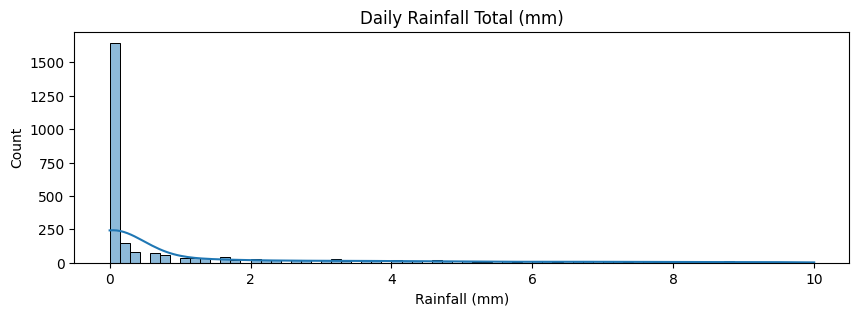

In [17]:
# Plot Histogram for Daily Rainfall Total (mm), excluding outliers
plt.figure(figsize=(10, 3))
sns.histplot(iqr(weather_data['Daily Rainfall Total (mm)']), kde=True, alpha = 0.5)
plt.xlabel('Rainfall (mm)')
plt.ylabel('Count')
plt.title('Daily Rainfall Total (mm)')
plt.show()


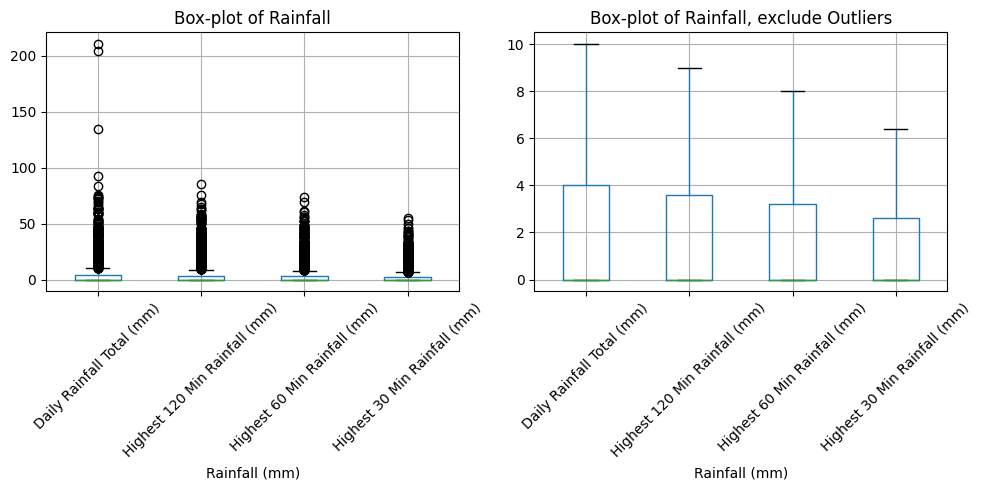

In [18]:
# Plot Box-Plots for Rainfall measures
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
weather_data[['Daily Rainfall Total (mm)',
              'Highest 120 Min Rainfall (mm)',
              'Highest 60 Min Rainfall (mm)',
              'Highest 30 Min Rainfall (mm)' ]].boxplot()
plt.xlabel('Rainfall (mm)')
plt.xticks(rotation = 45)
plt.title('Box-plot of Rainfall')

# Plot Box-Plots for Rainfall measures, excluding extreme values (outliers)
plt.subplot(1, 2, 2)
weather_data[['Daily Rainfall Total (mm)',
              'Highest 120 Min Rainfall (mm)',
              'Highest 60 Min Rainfall (mm)',
              'Highest 30 Min Rainfall (mm)' ]].boxplot(showfliers=False)
plt.xlabel('Rainfall (mm)')
plt.xticks(rotation = 45)
plt.title('Box-plot of Rainfall, exclude Outliers')

plt.tight_layout()
plt.show()

In [19]:
# Descriptive Statistics for Rainfall
weather_data[['Daily Rainfall Total (mm)',
              'Highest 120 Min Rainfall (mm)',
              'Highest 60 Min Rainfall (mm)',
              'Highest 30 Min Rainfall (mm)' ]].describe()

,Daily Rainfall Total (mm),Highest 120 Min Rainfall (mm),Highest 60 Min Rainfall (mm),Highest 30 Min Rainfall (mm)
count,3197.000000,3197.000000,3197.000000,3197.000000
mean,5.160213,4.367782,3.887082,3.147638
std,12.218700,9.601254,8.561361,6.703447
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000
75%,4.000000,3.600000,3.200000,2.600000
max,210.600000,85.600000,73.800000,55.400000


> Observed that for most of the days, the daily rainfall measure in the range from 0.0mm to 4.0mm with occasional heavy rainfall (up to 211mm) for some dates in the dataset.

Creating new features based on the differences of rainfall from lowest 30 Min Rainfall.

In [20]:
# New Feature: Difference of 'Highest 60 Min Rainfall (mm)' vs 'Highest 30 Min Rainfall (mm)
weather_data['rf_60min'] = (weather_data['Highest 60 Min Rainfall (mm)'] - weather_data['Highest 30 Min Rainfall (mm)'])

# New Feature: Difference of 'Highest 120 Min Rainfall (mm)' vs 'Highest 30 Min Rainfall (mm)'
weather_data['rf_120min'] = (weather_data['Highest 120 Min Rainfall (mm)'] - weather_data['Highest 30 Min Rainfall (mm)'])

# New Feature: Difference of 'max_daily_rainfall' vs 'Highest 30 Min Rainfall (mm)'
weather_data['rf_max'] = (weather_data['max_daily_rainfall'] - weather_data['Highest 30 Min Rainfall (mm)'])

In [21]:
weather_data[['rf_60min','rf_120min','rf_max']].describe()

,rf_60min,rf_120min,rf_max
count,3197.000000,3197.000000,3197.000000
mean,0.739443,1.220144,2.012574
std,2.512903,3.732852,7.331058
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000
75%,0.200000,0.400000,0.800000
max,32.200000,47.400000,187.000000


In [22]:
# After extracting the new features, dropping variables that are not required due to high correlation
weather_data = weather_data.drop(columns=['Highest 60 Min Rainfall (mm)', 'Highest 120 Min Rainfall (mm)', 'Daily Rainfall Total (mm)', 'max_daily_rainfall'], axis=1)

#### Temperature Measures

Based on the assumption of the consistency of Singapore weather temperature and do not expect significant fluctuation of daily temperature, for a time series data, imputing the missing temperature values based on these logic:

>**Forward Fill (ffill)** to propagates the previous day valid observation forward to the next day missing value.

In [23]:
# Forward fill 'Min Temperature (deg C)' for missing values
weather_data['Min Temperature (deg C)'] = weather_data['Min Temperature (deg C)'].fillna(method='ffill')

# Forward fill 'Max Temperature (deg C)' for missing values
weather_data['Maximum Temperature (deg C)'] = weather_data['Maximum Temperature (deg C)'].fillna(method='ffill')

# Calculate daily mean_temp and convert to numerical
weather_data['mean_temp'] = weather_data[['Maximum Temperature (deg C)', 'Min Temperature (deg C)']].mean(axis=1)

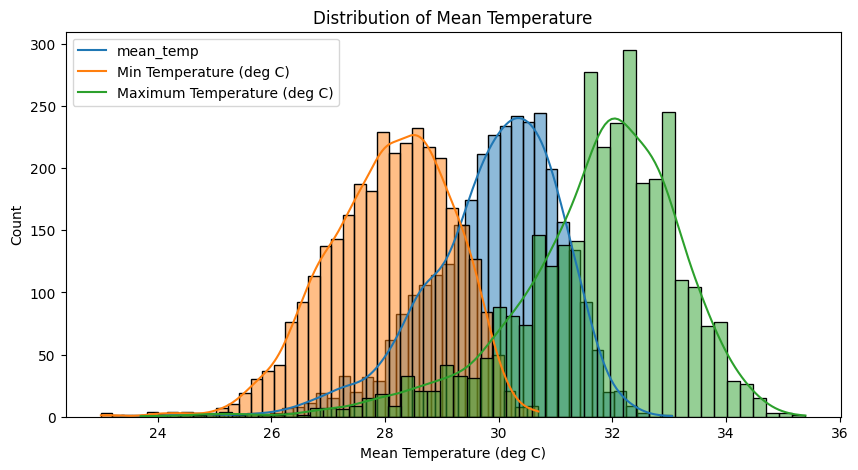

In [24]:
# Plot Histogram for 'mean_temp', 'Min Temperature (deg C)' and 'Maximum Temperature (deg C)
plt.figure(figsize=(10, 5))
sns.histplot(weather_data['mean_temp'], kde=True, alpha = 0.5)
sns.histplot(weather_data['Min Temperature (deg C)'], kde=True, alpha = 0.5)
sns.histplot(weather_data['Maximum Temperature (deg C)'], kde=True, alpha = 0.5)
plt.legend(['mean_temp', 'Min Temperature (deg C)', 'Maximum Temperature (deg C)'])
plt.xlabel('Mean Temperature (deg C)')
plt.ylabel('Count')
plt.title('Distribution of Mean Temperature')
plt.show()


Text(0.5, 1.0, 'Box-plot of Temperature')

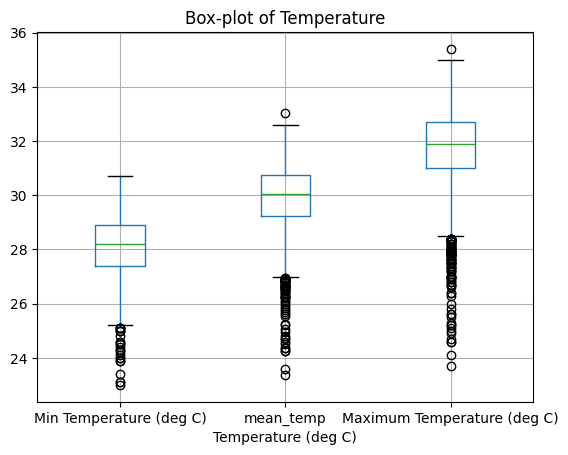

In [25]:
# Box-Plots for 'mean_temp', 'Min Temperature (deg C)' and 'Maximum Temperature (deg C)
weather_data[['Min Temperature (deg C)', 'mean_temp', 'Maximum Temperature (deg C)' ]].boxplot()
plt.xlabel('Temperature (deg C)')
plt.title('Box-plot of Temperature')

In [26]:
# New Feature: Difference of 'Min Temperature (deg C)' vs 'Maximum Temperature (deg C)'
weather_data['temp_range'] = weather_data['Maximum Temperature (deg C)'] - weather_data['Min Temperature (deg C)']

# Filter when 'Maximum Temperature (deg C)' is less then 'Min Temperature (deg C)'
weather_data[['temp_range', 'Min Temperature (deg C)','Maximum Temperature (deg C)']][weather_data['temp_range'] < 0]

,temp_range,Min Temperature (deg C),Maximum Temperature (deg C)
data_ref,,,
7bdc43a2-656c-474d-b0b7-5c0155331f9d,-0.4,28.7,28.3
3750d674-4af0-4337-8001-b49c1e0b1039,-1.4,27.8,26.4
01aedd4f-7f96-4579-9950-77bc570ac81b,-0.1,28.1,28.0
2e66e5ab-dead-4b01-8bb9-be1e5a90216e,-1.1,27.9,26.8
658531cd-be35-48bd-9962-cec0102f24b6,-0.1,28.8,28.7
28256663-eb6d-4757-aa4e-5320d715d045,-0.1,27.9,27.8
b9d1ff37-5873-4983-a7b3-73050f9ba946,-0.7,25.9,25.2
2050a04d-93d1-4e93-be6b-d17b4e184a9c,-1.2,25.8,24.6


In [27]:
# When 'Min Temperature (deg C)' is higher then 'Maximum Temperature (deg C)', take the lower values
weather_data['min_temp'] = weather_data[['Min Temperature (deg C)', 'Maximum Temperature (deg C)']].min(axis=1)

# 'Maximum Temperature (deg C)' is lower then 'Min Temperature (deg C)', take the higher values
weather_data['max_temp'] = weather_data[['Min Temperature (deg C)', 'Maximum Temperature (deg C)']].max(axis=1)

# Update Feature: Difference of 'Min Temperature (deg C)' vs 'Maximum Temperature (deg C)'
weather_data['temp_range'] = weather_data['max_temp'] - weather_data['min_temp']

The `wet-bulb temperature (WBT)` is the temperature read by a thermometer covered in cloth which has been soaked in water at ambient temperature (a wet-bulb thermometer) and over which air is passed.

At 100% relative humidity, the wet-bulb temperature is equal to the air temperature (dry-bulb temperature); at lower humidity the wet-bulb temperature is lower than dry-bulb temperature because of evaporative cooling.
 - source: https://en.wikipedia.org/wiki/Wet-bulb_temperature

Converting from Fahrenheit to Celsius for 'Wet Bulb Temperature (deg F)' using the formula: (°F - 32) x 5/9 =°C
 - source: https://sg.element14.com/temperature-converter

Text(0.5, 1.0, 'Distribution of Wet Bulb Temperature')

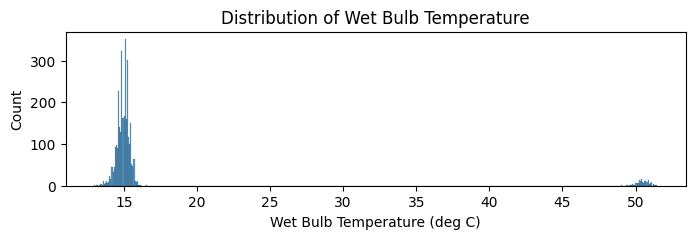

In [28]:
# Convert units of 'Wet Bulb Temperature' from deg F to deg C
weather_data['wbt_c'] = (weather_data['Wet Bulb Temperature (deg F)'] - 32) * 5/9

# Assuming that negative degress C is an error, convert all values to absolute number
weather_data['wbt_c'] = weather_data['wbt_c'].abs()

# Box-plot of 'wbt_c'
plt.figure(figsize=(8, 2))
sns.histplot(x=weather_data['wbt_c'])
plt.xlabel('Wet Bulb Temperature (deg C)')
plt.ylabel('Count')
plt.title('Distribution of Wet Bulb Temperature')

In [29]:
# Descriptive Statistics for Temparatures
weather_data[['Min Temperature (deg C)', 'min_temp', 'mean_temp', 'temp_range', 'Maximum Temperature (deg C)', 'max_temp', 'wbt_c' ]].describe()

,Min Temperature (deg C),min_temp,mean_temp,temp_range,Maximum Temperature (deg C),max_temp,wbt_c
count,3197.000000,3197.000000,3197.000000,3197.000000,3197.000000,3197.000000,3197.000000
mean,28.071505,28.069909,29.899281,3.658743,31.727057,31.728652,16.711205
std,1.090561,1.092609,1.191149,1.035395,1.481905,1.476448,7.716954
min,23.000000,23.000000,23.350000,0.000000,23.700000,23.700000,12.944444
25%,27.400000,27.400000,29.250000,3.000000,31.000000,31.000000,14.722222
50%,28.200000,28.200000,30.050000,3.700000,31.900000,31.900000,15.000000
75%,28.900000,28.900000,30.750000,4.400000,32.700000,32.700000,15.277778
max,30.700000,30.700000,33.050000,7.600000,35.400000,35.400000,51.500000


> Observed that the daily temperature range from 23 degC to 35.4 degC.

> It is noticed that the wet bulb temperature is somewhat abnormal for typyical temperature range when comparing against the range of daily temperature. The wet bulb temperature may have errors in recording and may have to consider to disregard this variable in modelling.

Nevertheless, in modelling, the numerical variables will be subjected to standard scalling.

In [30]:
# Dropping variables that are not required due to high correlation ('temp_mean') and duplication
weather_data = weather_data.drop(columns=['Min Temperature (deg C)', 'Maximum Temperature (deg C)', 'mean_temp'], axis=1)

#### Wind Speed Measures and Wind Direction

Based on the assumption of the consistency of Singapore weather and monsoon wind season, I do not expect significant fluctuation of daily wind speed for a time series data, therefore, the strategy for imputing the missing wind speed values based on **Forward Fill (ffill)** to propagates the previous day valid observation forward to the next day missing value.

In [31]:
# Convert to absolute values for Min and Max Wind Speed (km/h)
weather_data['Min Wind Speed (km/h)'] = weather_data['Min Wind Speed (km/h)'].abs()
weather_data['Max Wind Speed (km/h)'] = weather_data['Max Wind Speed (km/h)'].abs()

# Impute missing values for Min and Max Wind Speed (km/h) based on forward fill
weather_data['Min Wind Speed (km/h)'] = weather_data['Min Wind Speed (km/h)'].fillna(method='ffill')
weather_data['Max Wind Speed (km/h)'] = weather_data['Max Wind Speed (km/h)'].fillna(method='ffill')

# Calculate daily mean wind speed
weather_data['mean_wind speed'] = weather_data[['Min Wind Speed (km/h)', 'Max Wind Speed (km/h)']].mean(axis=1)


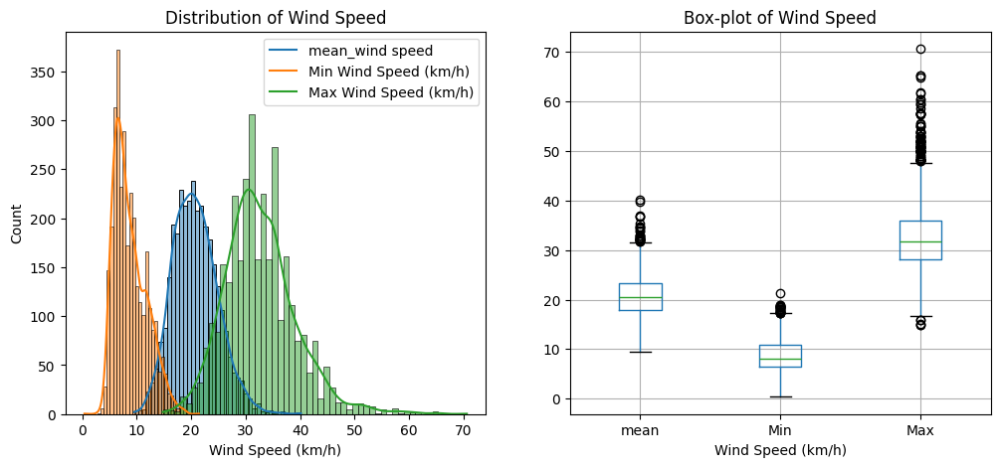

In [32]:
# Plot Histogram and Box-Plot to observe distribution of Wind Speed
plt.figure(figsize=(12, 5))

# Plot Histogram
plt.subplot(1, 2, 1)
sns.histplot(weather_data['mean_wind speed'], kde=True, alpha = 0.5)
sns.histplot(weather_data['Min Wind Speed (km/h)'], kde=True, alpha = 0.5)
sns.histplot(weather_data['Max Wind Speed (km/h)'], kde=True, alpha = 0.5)
plt.legend(['mean_wind speed', 'Min Wind Speed (km/h)', 'Max Wind Speed (km/h)'])
plt.xlabel('Wind Speed (km/h)')
plt.ylabel('Count')
plt.title('Distribution of Wind Speed')

# Plot Box-Plots
plt.subplot(1, 2, 2)
weather_data[['mean_wind speed', 'Min Wind Speed (km/h)', 'Max Wind Speed (km/h)']].boxplot()
plt.xlabel('Wind Speed (km/h)')
plt.xticks([1, 2, 3], ['mean', 'Min', 'Max'])
plt.title('Box-plot of Wind Speed')

plt.show()

In [33]:
# Descriptive Statistics for Wind Speed
weather_data[['mean_wind speed', 'Min Wind Speed (km/h)', 'Max Wind Speed (km/h)']].describe()

,mean_wind speed,Min Wind Speed (km/h),Max Wind Speed (km/h)
count,3197.000000,3197.000000,3197.000000
mean,20.722771,8.782171,32.663372
std,4.086233,2.975273,6.591621
min,9.550000,0.400000,14.800000
25%,17.800000,6.500000,28.100000
50%,20.500000,8.000000,31.700000
75%,23.300000,10.800000,36.000000
max,40.150000,21.400000,70.600000


> Observed that, on average, the daily wind speed range from 9.55 km/h to 40 km/h with occasional day having strong wind speed up to 70.6 km/h.

In [34]:
# Convert to upper case for 'Wind Direction' and extract only characters
weather_data['Wind Direction'] = weather_data['Wind Direction'].str.upper()
weather_data['Wind Direction'] = weather_data['Wind Direction'].str.extract(r'([A-Z]+)', expand=False)

# Replace values in Wind Direction,
weather_data['Wind Direction'] = weather_data['Wind Direction'].replace({
    'SOUTHEAST': 'SE',
    'NORTHEAST': 'NE',
    'WEST': 'W',
    'NORTHWEST': 'NW',
    'SOUTH': 'S',
    'EAST': 'E',
    'NORTHWARD': 'N',
    'NORTH': 'N',
    'SOUTHWARD': 'S'
    })


In [35]:
# Value Count for Wind Direction
weather_data['Wind Direction'].value_counts()

Wind Direction
SE    457
NW    403
N     403
NE    402
W     395
SW    388
S     381
E     368
Name: count, dtype: int64

#### Sunshine Duration, Cloud Cover (%) and Dew Point Category

Based on the assumption of the consistency of Singapore weather and monsoon wind season, I do not expect significant fluctuation of daily Sunshine Duration, Cloud Cover (%) and Dew Point for a time series data, therefore, the strategy for imputing the missing wind speed values based on **Forward Fill (ffill)** to propagates the previous day valid observation forward to the next day missing value.

In [36]:
# Impute missing values for 'Sunshine Duration (hrs)' and 'Cloud Cover (%)' with forward fill
weather_data['Sunshine Duration (hrs)'] = weather_data['Sunshine Duration (hrs)'].fillna(method='ffill')
weather_data['Cloud Cover (%)'] = weather_data['Cloud Cover (%)'].fillna(method='ffill')


In [37]:
# Descriptive Statistics for 'Sunshine Duration (hrs)' and 'Cloud Cover (%)'
weather_data[['Sunshine Duration (hrs)', 'Cloud Cover (%)']].describe()

,Sunshine Duration (hrs),Cloud Cover (%)
count,3197.000000,3197.000000
mean,7.022161,28.648108
std,1.376863,20.682754
min,0.000000,2.000000
25%,6.710000,17.000000
50%,7.400000,22.000000
75%,7.840000,30.000000
max,9.150000,100.000000


In [38]:
# Convert 'Dew Point Category' to upper case
weather_data['Dew Point Category'] = weather_data['Dew Point Category'].str.upper()

# Replace values in 'Dew Point Category'
weather_data['Dew Point Category'] = weather_data['Dew Point Category'].replace({
    'HIGH LEVEL': 'HIGH',
    'H': 'HIGH',
    'VH': 'VERY HIGH',
    'M': 'MODERATE',
    'NORMAL': 'MODERATE',
    'MINIMAL': 'LOW',
    'VL': 'VERY LOW',
    'BELOW AVERAGE': 'LOW',
    'L': 'LOW',
    'EXTREME': 'VERY HIGH'
})

In [39]:
# Value Count for Dew Point Category
weather_data['Dew Point Category'].value_counts()

Dew Point Category
HIGH         1517
VERY HIGH    1304
MODERATE      136
LOW           121
VERY LOW      119
Name: count, dtype: int64

In [40]:
# Ordinal encode for Dew Point Category
encoder = OrdinalEncoder(categories = [['VERY LOW', 'LOW', 'MODERATE', 'HIGH', 'VERY HIGH']])
weather_data['dew_pt'] = encoder.fit_transform(weather_data[['Dew Point Category']])

# Value Count for Dew Point Category
weather_data['dew_pt'].value_counts()

dew_pt
3.0    1517
4.0    1304
2.0     136
1.0     121
0.0     119
Name: count, dtype: int64

#### Review of cleaned up Weather Dataset

In [41]:
weather_data.info()

# Count of missing values for variables with missing values
for col in weather_data.columns:
  if weather_data[col].isnull().sum() > 0:
    print(f'{col} has {weather_data[col].isnull().sum()} missing values')

<class 'pandas.core.frame.DataFrame'>
Index: 3197 entries, 4d4d20c2-0167-4bc2-a62c-4df6e11fb2ea to 450fa1e1-470b-4e08-bb12-e5f4169a173d
Data columns (total 21 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   date                          3197 non-null   datetime64[ns]
 1   Highest 30 Min Rainfall (mm)  3197 non-null   float64       
 2   Min Wind Speed (km/h)         3197 non-null   float64       
 3   Max Wind Speed (km/h)         3197 non-null   float64       
 4   Sunshine Duration (hrs)       3197 non-null   float64       
 5   Cloud Cover (%)               3197 non-null   float64       
 6   Wet Bulb Temperature (deg F)  3197 non-null   float64       
 7   Relative Humidity (%)         3197 non-null   float64       
 8   Air Pressure (hPa)            3197 non-null   int64         
 9   Dew Point Category            3197 non-null   object        
 10  Wind Direction                3197

#### Split the air_quality_data into 2 dataframe, one for 'pm25_' and another for 'psi_' with date, separately clean up the dataframes and merge back based on the 'date' column

In [42]:
# Obtain the columns labels for 'pm25_' dataframe
pm25_labels = air_quality_data.columns.values[air_quality_data.columns.str.contains('pm25_')]
pm25_labels_d = np.append(pm25_labels, 'date')
print(pm25_labels)
print(pm25_labels_d)


# Obtain the columns labels for 'psi_' dataframe
psi_labels = air_quality_data.columns.values[air_quality_data.columns.str.contains('psi_')]
psi_labels_d = np.append(psi_labels, 'date')
print(psi_labels)
print(psi_labels_d)

['pm25_north' 'pm25_south' 'pm25_east' 'pm25_west' 'pm25_central']
['pm25_north' 'pm25_south' 'pm25_east' 'pm25_west' 'pm25_central' 'date']
['psi_north' 'psi_south' 'psi_east' 'psi_west' 'psi_central']
['psi_north' 'psi_south' 'psi_east' 'psi_west' 'psi_central' 'date']


In [43]:
# Create dataframe based on the 'pm25_labels' and 'psi_labels'
pm25_data = air_quality_data.loc[:, pm25_labels_d]
psi_data = air_quality_data.loc[:, psi_labels_d]

# Remove rows which all columns (exclude date) are NaN
pm25_data = pm25_data.dropna(subset = pm25_labels ,how='all')
psi_data = psi_data.dropna(subset = psi_labels, how='all')

# Remove duplicate rows of data
pm25_data = pm25_data.drop_duplicates()
psi_data = psi_data.drop_duplicates()

# Create 'pm25_mean' and 'psi_mean' for pm25_data and psi_data, ignore NaN
pm25_data['pm25_mean'] = pm25_data[pm25_labels].mean(axis=1, skipna=True)
pm25_data['pm25_mean'] = pd.to_numeric(pm25_data['pm25_mean'])
psi_data['psi_mean'] = psi_data[psi_labels].mean(axis=1, skipna=True)
psi_data['psi_mean'] = pd.to_numeric(psi_data['psi_mean'])

# For each columns of the pm25_data and psi_data (excluding date),
# fill the NaN with the mean values for each rows of the pm25_data and psi_data
# based on 'pm25_mean' and 'psi_mean' respectively
for col in pm25_labels:
  pm25_data[col].fillna(pm25_data['pm25_mean'], inplace=True)
  pm25_data[col] = pd.to_numeric(pm25_data[col])

for col in psi_labels:
  psi_data[col].fillna(psi_data['psi_mean'], inplace=True)
  psi_data[col] = pd.to_numeric(psi_data[col])


In [44]:
# Merge 'pm25_data' and 'psi_data' into a single dataframe based on date.
air_data = pd.merge(pm25_data, psi_data, on='date', how='outer')
air_data.head()

,pm25_north,pm25_south,pm25_east,pm25_west,pm25_central,date,pm25_mean,psi_north,psi_south,psi_east,psi_west,psi_central,psi_mean
0,20.000000,16.000000,18.0,23.0,19.0,2014-04-01,19.200000,58.0,56.0,57.0,66.0,59.0,59.2
1,18.000000,14.000000,17.5,22.0,16.0,2014-04-02,17.500000,57.0,53.0,54.0,61.0,56.0,56.2
2,12.000000,12.000000,10.0,14.0,10.0,2014-04-03,11.600000,55.0,53.0,52.0,59.0,54.0,54.6
3,22.666667,22.666667,24.0,19.0,25.0,2014-04-04,22.666667,58.0,57.0,55.0,56.5,56.0,56.5
4,18.000000,19.000000,21.0,13.0,17.0,2014-04-05,17.600000,64.0,64.0,66.0,65.0,66.0,65.0


#### Review of cleaned up Air Quality Dataset

In [45]:
air_data.info()

# Count of missing values for variables with missing values
for col in air_data.columns:
  if air_data[col].isnull().sum() > 0:
    print(f'{col} has {air_data[col].isnull().sum()} missing values')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3197 entries, 0 to 3196
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   pm25_north    3197 non-null   float64       
 1   pm25_south    3197 non-null   float64       
 2   pm25_east     3197 non-null   float64       
 3   pm25_west     3197 non-null   float64       
 4   pm25_central  3197 non-null   float64       
 5   date          3197 non-null   datetime64[ns]
 6   pm25_mean     3197 non-null   float64       
 7   psi_north     3197 non-null   float64       
 8   psi_south     3197 non-null   float64       
 9   psi_east      3197 non-null   float64       
 10  psi_west      3197 non-null   float64       
 11  psi_central   3197 non-null   float64       
 12  psi_mean      3197 non-null   float64       
dtypes: datetime64[ns](1), float64(12)
memory usage: 324.8 KB


### Merge both Weather and Air Quality Datasets together by 'Date' field

In [46]:
# Merge both weather_data and air_quality_data into a single dataframe based on "date" column
data = pd.merge(weather_data, air_data, on='date', how='left')


In [47]:
# Review merged dataset
data.info()

# Count of missing values for variables with missing values
for col in data.columns:
  if data[col].isnull().sum() > 0:
    print(f'{col} has {data[col].isnull().sum()} missing values')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3197 entries, 0 to 3196
Data columns (total 33 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   date                          3197 non-null   datetime64[ns]
 1   Highest 30 Min Rainfall (mm)  3197 non-null   float64       
 2   Min Wind Speed (km/h)         3197 non-null   float64       
 3   Max Wind Speed (km/h)         3197 non-null   float64       
 4   Sunshine Duration (hrs)       3197 non-null   float64       
 5   Cloud Cover (%)               3197 non-null   float64       
 6   Wet Bulb Temperature (deg F)  3197 non-null   float64       
 7   Relative Humidity (%)         3197 non-null   float64       
 8   Air Pressure (hPa)            3197 non-null   int64         
 9   Dew Point Category            3197 non-null   object        
 10  Wind Direction                3197 non-null   object        
 11  Daily Solar Panel Efficiency  

### Target Variable

In [48]:
# Review Target Variable: Daily Solar Panel Efficiency
print(data['Daily Solar Panel Efficiency'].value_counts())
print('\n==========')
print(data['Daily Solar Panel Efficiency'].value_counts(normalize=True))

Daily Solar Panel Efficiency
Medium    1749
Low        795
High       653
Name: count, dtype: int64

Daily Solar Panel Efficiency
Medium    0.547075
Low       0.248671
High      0.204254
Name: proportion, dtype: float64


Observed that the classes in the Target variable is generally imbalanced, with "Medium" being the majority class with 55%, followed by "Low" at 25% and "High" at 20%

In [49]:
# Ordinal encode Target Variable: Daily Solar Panel Efficiency
encoder = OrdinalEncoder(categories = [['Low', 'Medium', 'High']])
data['dsp_efficiency'] = encoder.fit_transform(data[['Daily Solar Panel Efficiency']])

# Value Count for Dew Point Category
data['dsp_efficiency'].value_counts()

dsp_efficiency
1.0    1749
0.0     795
2.0     653
Name: count, dtype: int64

In [50]:
# Copy data into df and set 'date' as index
df = data.set_index('date')

# Years in the index, date
year_range = df.index.year.unique().sort_values().tolist()
print(f'Years in data: {year_range}\n')

# Setting up the visualization style
sns.set(style="whitegrid")

# Setup selection of numerical features and drop 'dsp_efficiency'
data_num = df.select_dtypes(include=['int64', 'float64'])
data_num = data_num.drop(columns=['dsp_efficiency'], axis=1)

# Print list of numerical features and count
print(data_num.columns)
print('Total numerical features: %d' %len(data_num.columns))


Years in data: [2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022]

Index(['Highest 30 Min Rainfall (mm)', 'Min Wind Speed (km/h)',
       'Max Wind Speed (km/h)', 'Sunshine Duration (hrs)', 'Cloud Cover (%)',
       'Wet Bulb Temperature (deg F)', 'Relative Humidity (%)',
       'Air Pressure (hPa)', 'rf_60min', 'rf_120min', 'rf_max', 'temp_range',
       'min_temp', 'max_temp', 'wbt_c', 'mean_wind speed', 'dew_pt',
       'pm25_north', 'pm25_south', 'pm25_east', 'pm25_west', 'pm25_central',
       'pm25_mean', 'psi_north', 'psi_south', 'psi_east', 'psi_west',
       'psi_central', 'psi_mean'],
      dtype='object')
Total numerical features: 29


### Correlation Analysis

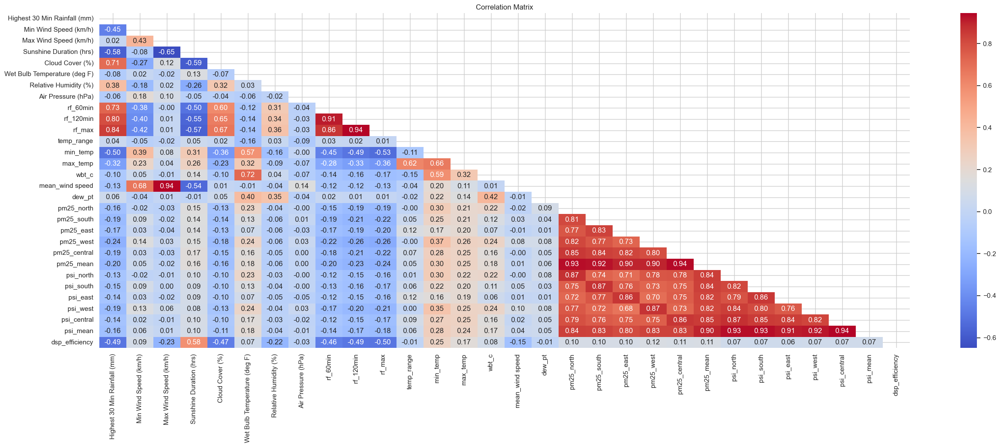

In [51]:
# Plotting Correlation Analysis Heatmaps
# Correlation matrix for all numerical variables
data_num = data.select_dtypes(include=['int64', 'float64'])

plt.figure(figsize=(30, 10))
corr_matrix = data_num.corr(method='spearman')  # Exclude target from correlation matrix calculation

mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix, mask=mask, annot=True, fmt=".2f", cmap='coolwarm')
plt.xticks(rotation=90)
plt.title('Correlation Matrix')
plt.show()


#### Calculation Correlation Table with Target Variable

In [52]:
# Resampling and Rolling Averages Function
def resample_and_roll(data, freq, roll_window, target = 'dsp_efficiency'):
    features = data.drop(columns = target)  # Exclude the target variable
    resampled_data = features.resample(freq).mean()  # Resample to mean of each period
    rolling_data = resampled_data.rolling(window=roll_window, min_periods=1).mean()
    return rolling_data.join(data[target])  # Merge the target back into the data

# Daily, Weekly and Monthly Data
daily_data = df.select_dtypes(include=['int64', 'float64'])

# Resample daily data into weekly data and then rolling average of over 4 weeks (i.e. analyse monthly trend)
weekly_data = resample_and_roll(daily_data, 'W', 7).dropna()

# Resample daily data into monthly data and then rolling average of over 3 months (i.e. analyse quarterly trend)
monthly_data = resample_and_roll(daily_data, 'MS', 3).dropna()

# Calculate Correlation and return DataFrame
daily_target = daily_data['dsp_efficiency']
weekly_target = weekly_data['dsp_efficiency']
monthly_target = monthly_data['dsp_efficiency']

daily_corr = daily_data.drop(columns= 'dsp_efficiency').corrwith(daily_target)
daily_abs_corr = daily_corr.abs()
weekly_corr = weekly_data.drop(columns= 'dsp_efficiency').corrwith(weekly_target)
weekly_abs_corr = weekly_corr.abs()
monthly_corr = monthly_data.drop(columns= 'dsp_efficiency').corrwith(monthly_target)
monthly_abs_corr = monthly_corr.abs()

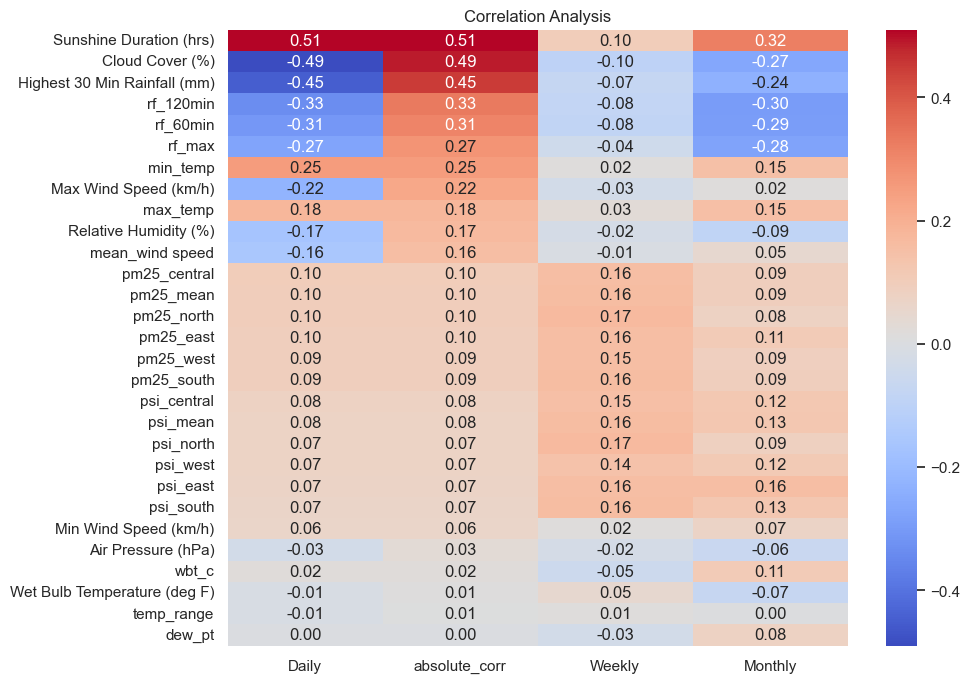

In [53]:
# Plotting Heatmaps
corr_df = pd.DataFrame({'Daily': daily_corr,
                        'absolute_corr': daily_abs_corr,
                        'Weekly': weekly_corr,
                        'Monthly': monthly_corr
                        })

plt.figure(figsize=(10, 8))
sns.heatmap(corr_df.sort_values(by='absolute_corr', ascending=False), annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Analysis')
plt.show()

> Observed that daily data show more correlation with the target variable and aggregating the data to weekly or monthly view reduced the correlation with the target variable. However, observed that the data increased correlation when aggregated to monthly view, signifying a need to analyse the inherent trend and seasonality of the time series data.

In [54]:
# List of columns names
col_labels = [col.lower() for col in data.columns]
print(col_labels)

# Obtain the columns labels for 'rainfall'
temp_grp = [col for col in data.columns if 'temp' in col.lower()]
print(temp_grp)

# Obtain the columns labels for 'wind speed'
wind_grp = [col for col in data.columns if 'wind speed' in col.lower()]
print(wind_grp)

# Obtain the columns labels for 'pm25_'
pm25_grp = [col for col in data.columns if 'pm25_' in col.lower()]
print(pm25_grp)

# Obtain the columns labels for 'psi_'
psi_grp = [col for col in data.columns if 'psi_' in col.lower()]
print(psi_grp)

['date', 'highest 30 min rainfall (mm)', 'min wind speed (km/h)', 'max wind speed (km/h)', 'sunshine duration (hrs)', 'cloud cover (%)', 'wet bulb temperature (deg f)', 'relative humidity (%)', 'air pressure (hpa)', 'dew point category', 'wind direction', 'daily solar panel efficiency', 'rf_60min', 'rf_120min', 'rf_max', 'temp_range', 'min_temp', 'max_temp', 'wbt_c', 'mean_wind speed', 'dew_pt', 'pm25_north', 'pm25_south', 'pm25_east', 'pm25_west', 'pm25_central', 'pm25_mean', 'psi_north', 'psi_south', 'psi_east', 'psi_west', 'psi_central', 'psi_mean', 'dsp_efficiency']
['Wet Bulb Temperature (deg F)', 'temp_range', 'min_temp', 'max_temp']
['Min Wind Speed (km/h)', 'Max Wind Speed (km/h)', 'mean_wind speed']
['pm25_north', 'pm25_south', 'pm25_east', 'pm25_west', 'pm25_central', 'pm25_mean']
['psi_north', 'psi_south', 'psi_east', 'psi_west', 'psi_central', 'psi_mean']


In [55]:
# Subset corr_df by respective group
low_corr = []

for grp in [temp_grp, wind_grp, pm25_grp, psi_grp]:
  grp_df = corr_df.loc[grp].sort_values(by='absolute_corr', ascending=False)
  print(grp_df)
  print('List of lower correlated variables %s' %grp_df.index.tolist()[1:])
  print('===========\n')
  low_corr.append(grp_df.index.tolist()[1:])

print('Variables to remove from dataset:')
low_corr = [item for sublist in low_corr for item in sublist]
print(low_corr)


                                 Daily  absolute_corr    Weekly   Monthly
min_temp                      0.254730       0.254730  0.017409  0.149313
max_temp                      0.181768       0.181768  0.026075  0.153049
Wet Bulb Temperature (deg F) -0.012812       0.012812  0.048525 -0.069207
temp_range                   -0.009610       0.009610  0.014223  0.003427
List of lower correlated variables ['max_temp', 'Wet Bulb Temperature (deg F)', 'temp_range']

                          Daily  absolute_corr    Weekly   Monthly
Max Wind Speed (km/h) -0.224302       0.224302 -0.029395  0.017295
mean_wind speed       -0.157516       0.157516 -0.007960  0.046972
Min Wind Speed (km/h)  0.064271       0.064271  0.016387  0.068818
List of lower correlated variables ['mean_wind speed', 'Min Wind Speed (km/h)']

                 Daily  absolute_corr    Weekly   Monthly
pm25_central  0.102392       0.102392  0.158093  0.094873
pm25_mean     0.098601       0.098601  0.161338  0.094142
pm25_north  

Based on the analysis of correlation of the features:
* Temperature: ['max_temp', 'Wet Bulb Temperature (deg F)', 'temp_range']
could be removed and retain only **'min_temp'** which is most correlated with the target variable.
* Wind Speed: ['mean_wind speed', 'Min Wind Speed (km/h)']
could be removed and retain only **'Max Wind Speed'** which is most correlated with the target variable.
* PM25 and PSI: ['pm25_mean', 'pm25_north', 'pm25_east', 'pm25_west', 'pm25_south'], ['psi_mean', 'psi_north', 'psi_west', 'psi_east', 'psi_south']
could be removed and retain only **'pm25_central'** and **'psi_central'** which are most correlated with the target variable. It could be that the Solar Panel are location in the central region...


In [56]:
# Scatter Plot Matrix with different colors for each target class, excluding list of variables in low_corr
def scatter_matrix(data, title):
    colors = {0: 'blue', 1: 'green', 2: 'red'}
    pd.plotting.scatter_matrix(data.drop(columns='dsp_efficiency'), alpha=0.5, figsize=(30, 25), diagonal='kde',
                               c=data['dsp_efficiency'].apply(lambda x: colors[x]))
    plt.suptitle(title)
    plt.show()


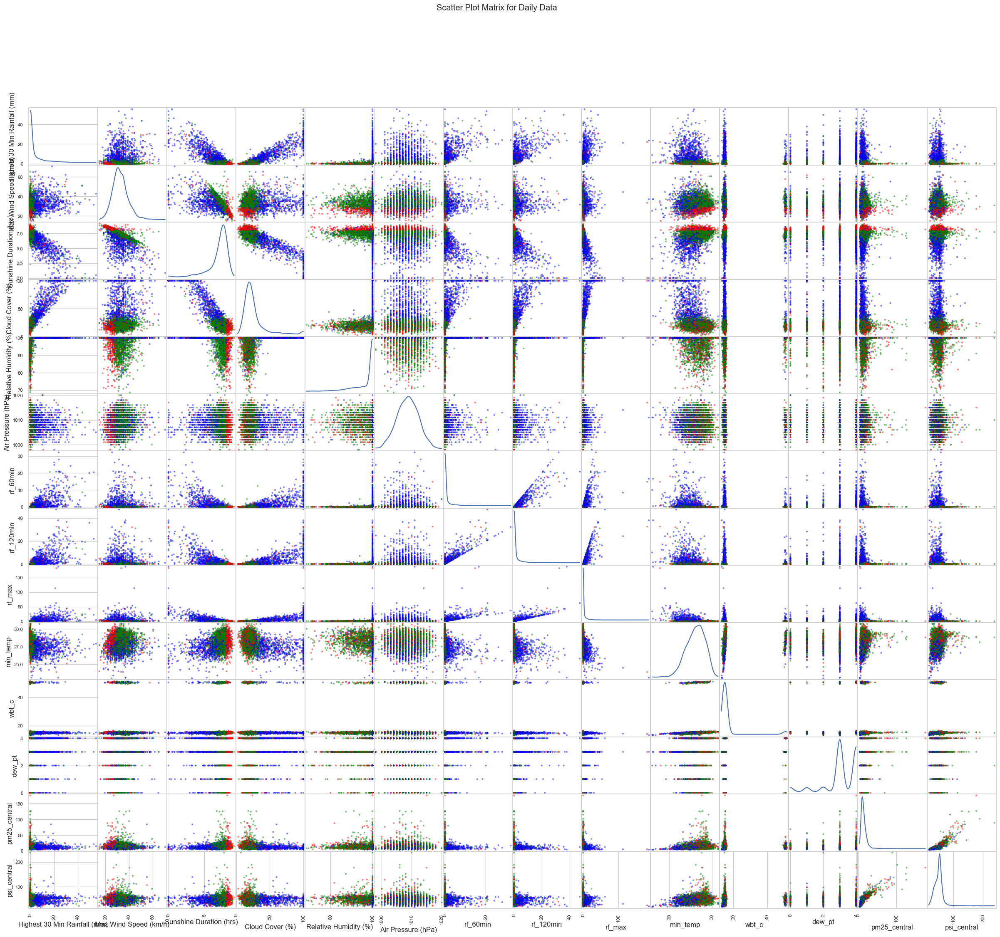

In [57]:
scatter_matrix(data_num.drop(columns = low_corr), 'Scatter Plot Matrix for Daily Data')


> Based on the scatter plot, colour distinguishing the classes of the DSP Efficiency, observed that there are observable clustering of data for each class (i.e. High, Medium, Low) for numerical features: Rainfall, Wind Speed, Sunshine Duration, Relative Hudmidity, Air Presure, Temperature, pm25 and PSI.

In [58]:
# Exclude low_corr variables
df = df.drop(columns = low_corr)
data_num = data_num.drop(columns = low_corr)

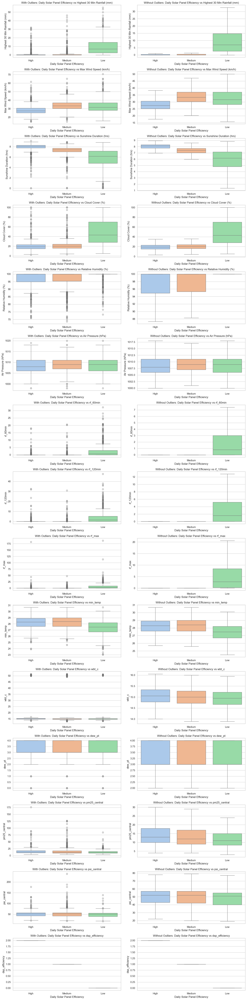

In [59]:
# Plot Box Plots for Numerical Variables against Target Variable
num_features = len(data_num.columns)
num_rows = num_features  # Calculate the number of rows needed
fig, axes = plt.subplots(nrows=num_rows, ncols=2, figsize=(15, num_rows * 4))  # Adjust figure size accordingly

# Flatten the axes for easier indexing
axes = axes.flatten()

i = 0  # Initialize index for axes
for col in df.columns:
    if df[col].dtype == 'object' and col == 'Daily Solar Panel Efficiency':
        for num in data_num.columns:

            # Plot with outliers
            sns.boxplot(x=col, y=num, data=df, ax=axes[i], palette='pastel')
            axes[i].set_title(f'With Outliers: {col} vs {num}')
            i += 1

            # Plot without outliers
            sns.boxplot(x=col, y=num, data=df, ax=axes[i], palette='pastel', showfliers=False)
            axes[i].set_title(f'Without Outliers: {col} vs {num}')
            i += 1

# Adjust layout and display
plt.tight_layout()
plt.show()


> Summary of Observations:
* Rainfall: More rainfall when the Daily Solar Panel (DSP) Efficiency is low.
* Temperature: Lower Temperature corresponds with low DSP Efficiency.
* Max Wind Speed: DSP Efficiency is medium or low correlated to higher Max Wind Speed.
* Sunshine Duration and Cloud Cover: DSP Efficiency occurs for lower * * * Sunshine Duration and higher Cloud Cover.
* Relative Humidity: Lower Relative Humidity correlated with High and Medium DSP Efficiency.  
* Air Pressure, Wet Bulb Temperature (WBT), Dew Point, PM 25 and PSI are not showing obvious variation across different classes of DSP Efficiency.



### Time Series Analysis

#### Implications of Seasonality on Stationarity
Definition of Stationarity: A stationary time series has a constant mean, variance, and autocorrelation structure over time. When a time series exhibits seasonality, it often violates these conditions:

Constant Mean: A seasonal pattern implies that the mean of the series can vary at different times of the year, which violates the assumption of a constant mean.
Constant Variance: Similarly, in many seasonal patterns, the variance of the time series might also change over time, particularly if the magnitude of seasonal fluctuations varies.
Autocorrelation Structure: Seasonal patterns inherently affect the autocorrelation structure, as the correlation between observations will depend on the time of year and the lag at which it is measured.

The following are consideration for working with time series data in a supervised classification problem :

1. Temporal Dependence
- **Auto-correlation**: Time series data points are typically dependent on previous time points. This temporal dependence means that traditional assumptions of independent and identically distributed (i.i.d.) data do not hold.
- **Feature Engineering**: Extracting features that capture this dependence, such as lags, rolling averages, or differences, can be crucial. Time-based features (like Weeks and Months) can also help capture patterns in the data.

2. Data Splitting
- **Sequential Split**: In time series data, the train/test split must maintain the temporal order of observations. Using future data to predict past events can lead to unrealistic model performance (data leakage).
- **Expanding or Rolling Window**: Techniques like expanding or rolling window validation are often used instead of traditional cross-validation to better simulate real-world scenarios where models are trained on past data and used to predict future data.

3. Seasonality and Trends
- **Handling Seasonality**: Many time series exhibit seasonal patterns which should be accounted for in the model. This could involve adjusting the data to remove seasonality or explicitly modeling it within your features.
- **Trends**: Similarly, identifying and adjusting for trends in your data can prevent the model from being biased towards historical trends that no longer apply.

4. Stationarity
- **Testing for Stationarity**: Time series data often need to be stationary for certain models to perform well. Techniques such as differencing, transformation (e.g., logarithmic), or detrending can be used to achieve stationarity.
- **Implications**: Non-stationary data can result in models that are biased or inefficient, as they might capture spurious relationships.
- Stationarity Test (Augmented Dickey-Fuller Test)
- Autocorrelation Test (Ljung-Box Test)

Consideration for the results:
* If a series is non-stationary and shows autocorrelation: Consider differencing the series.
* If a series is stationary but shows autocorrelation: This might indicate a potential to use models that capture autocorrelation directly.
* If a series is stationary and shows no autocorrelation: The series might be modeled well using simpler methods or used as input to more complex models without further differencing or transformation.

Interpreting the Durbin-Watson Statistic
Values close to 2.0 suggest that there is no autocorrelation in the residuals.
Values deviating significantly from 2.0 indicate the presence of positive autocorrelation if less than 2.0, or negative autocorrelation if greater than 2.0.


> Based on the observation, I can identify that rainfall, temperature, wind speed, air pressure, pm25 as well as psi has trends and seasonality in the time series data when the data are aggregated (or resample) to monthly mean and plotted on a rolling 3 months basis.

> It is relevant that the data series is **Stationary** for the modelling and as per the experimentation, differencing with periods = 30 is able to make the non-stationary data into stationary as validated by the Stationarity Test (Augmented Dickey-Fuller Test).

> Stationarity Test (Augmented Dickey-Fuller Test) or ADF Test will also be used in the preprocessing steps to help me to identify the numerical data to be differenced with periods = 30.

In [60]:
# List of Years in the data
data_years = df.index.year.unique().tolist()
print(data_years)

[2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022]


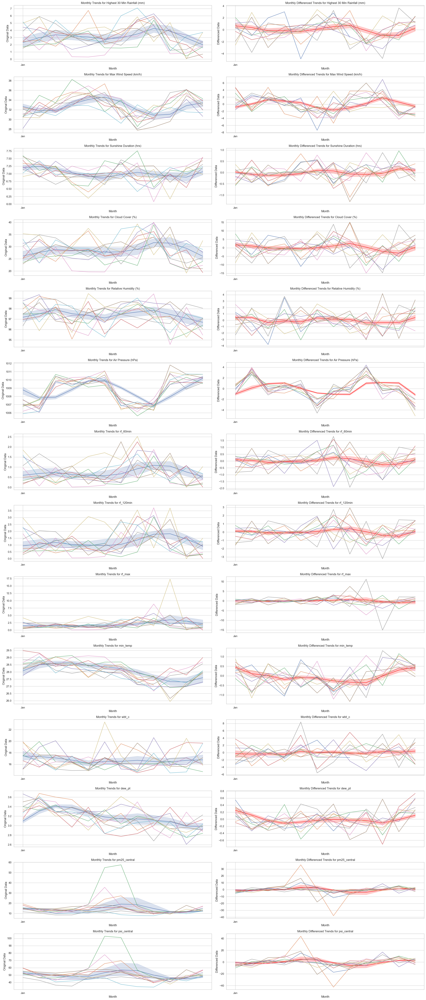

In [63]:
# Define moving average function
def moving_average(data, window_size):
    """Compute simple moving average."""
    return data.rolling(window=window_size, min_periods=1).mean()

# Ensure data_num's index is a datetime type
data_num.index = pd.to_datetime(data_num.index)

# Calculate number of rows needed for two plots per feature
num_features = len(data_num.columns)
fig, axes = plt.subplots(nrows=num_features, ncols=2, figsize=(24, num_features * 4))  # Adjust figure size accordingly

# Specify the years' data to plot
years = [2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022]

# Filter data_num by years
filtered_data = data_num[data_num.index.year.isin(years)]

# Resample data to Monthly Start ('MS'), taking the mean of daily values
resampled_data = filtered_data.resample('MS').mean()

# Calculate the differenced data
differenced_data = filtered_data.diff(periods=30).dropna()  # Remove NaNs that arise from differencing
resampled_differenced_data = differenced_data.resample('MS').mean()

# Apply moving average to smoothed trends
window_size = 3  # Set this to your preferred window size, e.g., 3 for 3 points rolling average
smoothed_data = moving_average(resampled_data, window_size)
smoothed_differenced_data = moving_average(resampled_differenced_data, window_size)

for i, col in enumerate(resampled_data.columns):
    # Plot original resampled data by year as a filled band and lines for each year
    ax = axes[i, 0]
    normalized_dates = resampled_data.index.strftime('%b')
    sns.lineplot(x=normalized_dates, y=smoothed_data[col], ax=ax, alpha=0.9)

    for year in years:
        yearly_data = resampled_data[resampled_data.index.year == year]
        sns.lineplot(x=yearly_data.index.strftime('%b'), y=yearly_data[col], ax=ax, alpha = 0.8)

    ax.set_title(f"Monthly Trends for {col}")
    ax.set_ylabel('Original Data')
    ax.set_xlabel('Month')
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
    #ax.legend()

    # Plot differenced data by year as a filled band and lines for each year
    ax_diff = axes[i, 1]
    normalized_dates_diff = resampled_differenced_data.index.strftime('%b')
    sns.lineplot(x=normalized_dates_diff, y=smoothed_differenced_data[col], ax=ax_diff, alpha=0.9, color='red')

    for year in years:
        yearly_diff_data = resampled_differenced_data[resampled_differenced_data.index.year == year]
        sns.lineplot(x=yearly_diff_data.index.strftime('%b'), y=yearly_diff_data[col], ax=ax_diff, alpha = 0.8)

    ax_diff.set_title(f"Monthly Differenced Trends for {col}")
    ax_diff.set_ylabel('Differenced Data')
    ax_diff.set_xlabel('Month')
    ax_diff.xaxis.set_major_locator(mdates.MonthLocator())
    ax_diff.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
    #ax_diff.legend()

plt.tight_layout()
plt.show()


>**Note on Legend**:

> - Each line plot represent each year across Jan to Dec to visual existence of the seasonal fluctuation of the data.
> - The shaded band represent the confidence interval around the average of yearly data after being smoothed by the moving average.
  
Based on the graphical observation on a rolling 3 months charts for all numerical Rainfall, Wind Speed, Sunshine Duration, Cloud Cover, Relative Humidity, Air Pressure, Temperature, Dew Point, PM25, PSI, whose data are resampled (by mean) to monthly average, there are potential of existence of the seasonal fluctuation of the data that requires further statistical test to validate.


In [64]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.stats.stattools import durbin_watson
from statsmodels.tsa.seasonal import seasonal_decompose

# Setup selection of numerical features and drop 'dsp_efficiency'
data_num = df.select_dtypes(include=['int64', 'float64'])
data_num = data_num.drop(columns=['dsp_efficiency'], axis=1)

# Initialize a DataFrame to store results
results = []

# Define a function to assess significant trend or seasonality
def assess_components(decomp):
    trend_effect = np.nanmean((decomp.trend - decomp.trend.mean())**2)
    seasonal_effect = np.nanmean((decomp.seasonal - decomp.seasonal.mean())**2)

    # Threshold 0.1 is arbitrary; to consider to adjust based on data's scale and results
    has_trend = 'Yes' if trend_effect > 0.1 else 'No'
    has_seasonality = 'Yes' if seasonal_effect > 0.1 else 'No'
    return has_trend, has_seasonality

# Function to perform ADF test
def perform_adf_test(series):
    result = adfuller(series.dropna(), autolag='AIC')
    return {
        'ADF Statistic': result[0],
        'p-value': result[1],
        'Stationary': result[1] < 0.025
    }

# Function to perform ljung_box test
def perform_ljung_box_test(series, lags=1):
    lb_test = acorr_ljungbox(series.dropna(), auto_lag=True, return_df=True)
    return {
        'LB Statistic': lb_test['lb_stat'].iloc[0],
        'LB p-value': lb_test['lb_pvalue'].iloc[0],
        'Autocorrelations': lb_test['lb_pvalue'].iloc[0] < 0.025
    }

# Function to perform durbin_watson test
def perform_durbin_watson_test(series):
    dw_statistic = durbin_watson(series.dropna())
    return {
        'DW Statistic': dw_statistic,
        'Autocorrelations': False if dw_statistic > 1.5 and dw_statistic < 2.5 else True
    }

# Resample data to Monthly Start ('MS'), taking the mean of daily values
resampled_data = filtered_data.resample('MS').mean()

# Calculate the differenced data
differenced_data = filtered_data.diff(periods=30).fillna(0)  # Monthly (30 periods) difference to highlight changes
differenced_data = differenced_data.resample('MS').mean()

# Define moving average function
def moving_average(data, window_size):
    """Compute simple moving average."""
    return data.rolling(window=window_size).mean()

# Apply moving average to smoothed trends
window_size = 3  # Set this to your preferred window size, e.g., 3 for 3 points rolling average
resampled_data = moving_average(resampled_data, window_size)
differenced_data = moving_average(resampled_differenced_data, window_size)


# Perform analysis on each feature
for column in data_num.columns:

    # Seasonal decomposition
    # Adjust 'period' based on data's seasonality
    decomposition = seasonal_decompose(data_num[column], model='additive', period=30)

    # Assess trend and seasonality
    trend, seasonality = assess_components(decomposition)

    # Perform ADF test on original and differenced data
    adf_original = perform_adf_test(data_num[column])
    adf_resampled = perform_adf_test(resampled_data[column])
    adf_detrended = perform_adf_test(decomposition.resid)
    adf_differenced = perform_adf_test(differenced_data[column])

    # ADF test results
    adf_outcome = {
        #'Stationary Original': adf_original['Stationary'],
        'Stationary Sampled': adf_resampled['Stationary'],
        #'Stationary Detrended': adf_detrended['Stationary'],
        'Stationary Differenced': adf_differenced['Stationary']
    }

    # Perform Autocorrelation test on differenced data
    lb_results_org = perform_ljung_box_test(resampled_data[column])
    lb_results = perform_ljung_box_test(differenced_data[column])
    dw_results_org = perform_durbin_watson_test(resampled_data[column])
    dw_results = perform_durbin_watson_test(differenced_data[column])

    # Autocorrelation test results
    auto_outcome = {
        'LB Test Autocorrelation Original': lb_results_org['Autocorrelations'],
        'LB Test Autocorrelation Differenced': lb_results['Autocorrelations'],
        #'DW Test Statistics': dw_results['DW Statistic'],
        'DW Test Autocorrelation Original': dw_results_org['Autocorrelations'],
        'DW Test Autocorrelation Differenced': dw_results['Autocorrelations']
    }

    # Store results
    results.append({
        'Feature': column,
        'Has Trend': trend,
        'Has Seasonality': seasonality,
        **adf_outcome,
        **auto_outcome
    })

# Convert results to DataFrame for analysis
results_df = pd.DataFrame(results)
results_df


,Feature,Has Trend,Has Seasonality,Stationary Sampled,Stationary Differenced,LB Test Autocorrelation Original,LB Test Autocorrelation Differenced,DW Test Autocorrelation Original,DW Test Autocorrelation Differenced
0,Highest 30 Min Rainfall (mm),Yes,Yes,False,True,True,True,True,True
1,Max Wind Speed (km/h),Yes,Yes,False,True,True,True,True,True
2,Sunshine Duration (hrs),No,No,False,True,True,False,True,False
3,Cloud Cover (%),Yes,Yes,False,True,True,False,True,False
4,Relative Humidity (%),Yes,Yes,True,True,True,False,True,False
5,Air Pressure (hPa),Yes,Yes,False,True,True,True,True,True
6,rf_60min,Yes,No,False,True,True,False,True,False
7,rf_120min,Yes,Yes,False,True,True,False,True,False
8,rf_max,Yes,Yes,False,True,True,False,True,False
9,min_temp,Yes,No,True,False,True,True,True,True


> There is not enough evidence under seasonal decomposition that Sunshine Duration and Dew Point has trend or seasonality in the data.
Under ADF Test, Relative Humidity, Min Temperature, Dew Point are Stationary (Result: “True”).

> The rest of the numerical features (Rainfall, Wind Speed, Sunshine Duration, Cloud Cover, Air Pressure, PM25, PSI) do not have significant evidence (p value > 0.025, i.e. >5%) to reject the null hypotheses that the data is non-stationary, (i.e. The data is not Stationary). When these non-stationary features undergo First Order Differencing (periods=30), the data series exhibited Stationary.

> All of the numerical features test showing evidence of autocorrelation. When these non-stationary features undergo First Order Differencing (periods=30), Sunshine Duration, Cloud cover, Relative Humidity, rf_60min, rf_120min, rf_max and wbt_c managed to removed their autocorrelation.

> During the preprocessing of the data, will need to consider to select **non-stationary** features to be differenced.


#### Testing the Correlation between the Original Features and the Differenced Features.

For consideration to use the differenced features together with the original features, it is important to test if there are strong correlation between the original and differenced features to avoid the impact of multicollinearity amongst the features to the modelling.

**Spearman's Rank Correlation** is used to calculate the correlation using ranks as it can handle outliers and non-linear relationships better than Pearson's correlation.

In [65]:
from scipy.stats import spearmanr

# Compute Spearman correlations
combined_data = pd.concat([filtered_data, differenced_data.add_suffix(f'_diff')], axis=1).dropna()
spearman_corr_matrix = combined_data.corr(method='spearman')

# Test_significance
significance_results = {}

for feature in filtered_data.columns:
        diff_feature = f'{feature}_diff'
        if diff_feature in combined_data.columns:
            corr, p_value = spearmanr(combined_data[feature], combined_data[diff_feature])
            significance_results[feature] = {'Correlation': corr, 'P-value': p_value, 'Is Correlated': p_value < 0.025} # alpha 5% /2


significance_results_df = pd.DataFrame(significance_results).T
significance_results_df.sort_values(by='Correlation', ascending=False, inplace=True)
significance_results_df

,Correlation,P-value,Is Correlated
pm25_central,0.508372,0.0,True
psi_central,0.477231,0.0,True
rf_max,0.401587,0.000029,True
rf_120min,0.381163,0.000077,True
min_temp,0.340806,0.000456,True
Highest 30 Min Rainfall (mm),0.333795,0.000607,True
Air Pressure (hPa),0.320158,0.001037,True
rf_60min,0.289026,0.003217,True
Cloud Cover (%),0.224422,0.023352,True
Max Wind Speed (km/h),0.171866,0.084124,False


> Observed that there are statistical evidence to reject the hypotheses that there is no correlation between the original and differenced features (p-value <'0.025'), the correlation is generally weak with the highest only up to 51%.

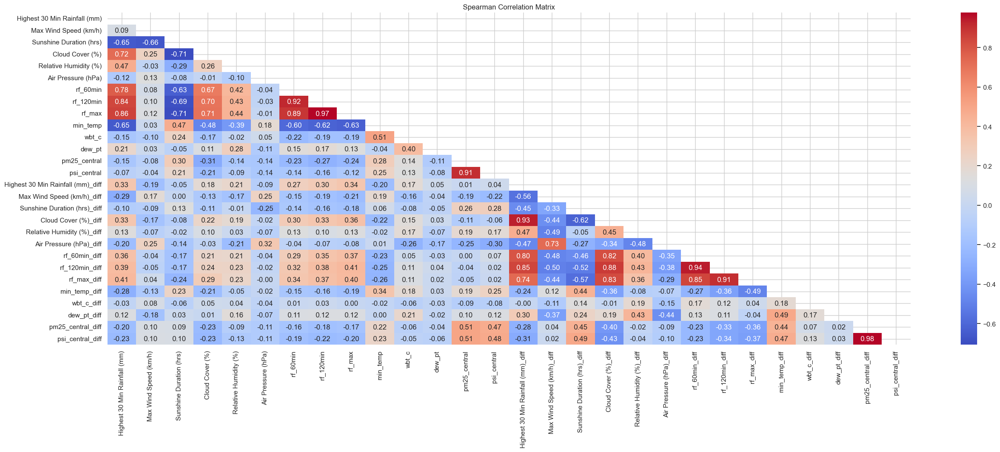

In [66]:
# Plotting Correlation Analysis Heatmaps
# Correlation matrix for all original and Differenced numerical variables
plt.figure(figsize=(30, 10))

mask = np.triu(np.ones_like(spearman_corr_matrix, dtype=bool))
sns.heatmap(spearman_corr_matrix, mask=mask, annot=True, fmt=".2f", cmap='coolwarm')
plt.xticks(rotation=90)
plt.title('Spearman Correlation Matrix')
plt.show()


### Features Filtering with Random Forest Algorithm

Using feature importance scores from a Random Forest model is an effective strategy to identify and select the most relevant features for modeling. As Random Forest is non-parametric, it adeptly handles data without requiring the normal distribution assumption for the target variable. This flexibility extends to its ability to manage complex, nonlinear relationships between features and the target, making it highly adaptable to various data types.

Importantly, Random Forest models do not require feature scaling, as their decision-making process is based on the order of data rather than its absolute values. This characteristic simplifies preprocessing steps, reducing the potential for data distortion that can occur with normalization or standardization. However, it's worth noting that while Random Forest can inherently manage categorical variables through splits on these features, practical implementations such as in scikit-learn necessitate converting categorical variables into a numerical format, often through one-hot encoding.

Given these advantages, Random Forest serves as an ideal algorithm for a preliminary approach to feature selection. This method not only helps in improving the efficiency and performance of the model by reducing dimensionality and avoiding overfitting but also significantly decreases training time by focusing on the most impactful features.

In summary, employing Random Forest for initial feature selection processes offers a robust, straightforward approach that enhances modeling outcomes, particularly when dealing with diverse datasets and complex variable interactions.

In [67]:
from sklearn.ensemble import RandomForestClassifier

# Define a class function to obtain list of features importance with Random Forest
class RandomForestFeatureSelector:
    def __init__(self, X_train, y_train):
        self.X_train = X_train
        self.y_train = y_train
        self.X_encoded = None
        self.y_encoded = None
        self.features = []
        self.feature_original = {}
        self.n_estimators = 100
        self.random_state = 42
        self.model = None
        self.df_importance = None
        self.importances = None
        self.low_importance = None

    # Function to preprocess the features
    def preprocess_features(self):
        """
        Preprocesses the features by encoding categorical variables using one-hot encoding.
        """
        X = self.X_train
        y = self.y_train
        X_y = pd.concat([X, y], axis=1).dropna()
        X = X_y.drop(y.name, axis=1)
        self.y_encoded = X_y[y.name]
        self.X_encoded = pd.get_dummies(X, drop_first=True)
        self.features = self.X_encoded.columns
        for original_feature in X.columns:
            if X[original_feature].dtype in ['object', 'category']:
                encoded_features = [col for col in self.X_encoded.columns if col.startswith(original_feature + '_')]
                for feature in encoded_features:
                    self.feature_original[feature] = original_feature
            else:
                self.feature_original[original_feature] = original_feature
        return self.X_encoded , self.y_encoded


    # Function to fit the RandomForest model
    def fit(self, n_estimators=100, random_state=42):
        """
        Fits the RandomForest model and stores feature importances.
        """
        self.n_estimators = n_estimators
        self.random_state = random_state
        self.model = RandomForestClassifier(n_estimators=self.n_estimators, random_state=self.random_state)
        self.model.fit(self.X_encoded, self.y_encoded)
        self.importances = self.model.feature_importances_
        return self # Allowing method chaining


    # Function to get DataFrame of features with importance
    def df_importance_features(self):
        if self.importances is None:
            raise ValueError("Model has not been fitted.")
        importance_data = {
            "Encoded Feature": self.features,
            "Original Feature": [self.feature_original[f] for f in self.features],
            "Importance": self.importances
        }
        self.df_importance = pd.DataFrame(importance_data)
        #self.df_importance = self.df_importance.groupby("Original Feature")['Importance'].sum().reset_index()
        self.df_importance = self.df_importance.sort_values(by="Importance", ascending=False).reset_index(drop=True)

        return self.df_importance


    # Function to get list of features with low importance
    def low_importance_features(self, threshold=0.02):
        if self.df_importance is None:
            raise ValueError("Feature importances have not been calculated or are empty. Ensure df_importance_features() is called and successful.")

        # Apply the threshold to the 'Importance' column to create the mask directly
        low_importance_mask = self.df_importance['Importance'] < threshold

        # Use the mask to filter the DataFrame
        self.low_importance = self.df_importance[low_importance_mask]
        self.low_importance = self.low_importance.sort_values(by='Importance', ascending=False).reset_index(drop=True)

        if self.low_importance.empty:
            print(f"No features with low importance based on the threshold <= {threshold}.")
            return None
        else:
            print(f"Low importance features based on the threshold <= {threshold}:")
            return self.low_importance


    # Function to plot top n_features importance
    def plot_high_importance_features(self, n_features=10):
        high_importance = self.df_importance_features().head(n_features)
        if not high_importance.empty:
            plt.figure(figsize=(10, 6))
            sns.set_style('whitegrid')
            sns.barplot(x='Importance', y='Original Feature', data=high_importance)
            plt.xticks(rotation=45, ha='right')
            plt.title(f'Top {n_features} High Feature Importance Variables')
            plt.xlabel('Feature Importance')
            plt.ylabel('Features')
            plt.show()
            return high_importance
        else:
            print("No features with high importance.")
            return None

# Example usage:
# rf_selector = RandomForestFeatureSelector(X_train, y_train)
# rf_selector.fit()
# print("Low importance features:", rf_selector.low_importance_features())
# rf_selector.plot_high_importance_features(n_features=10)


In [68]:
# Inspect data to run
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3197 entries, 2014-04-01 to 2022-12-31
Data columns (total 18 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Highest 30 Min Rainfall (mm)  3197 non-null   float64
 1   Max Wind Speed (km/h)         3197 non-null   float64
 2   Sunshine Duration (hrs)       3197 non-null   float64
 3   Cloud Cover (%)               3197 non-null   float64
 4   Relative Humidity (%)         3197 non-null   float64
 5   Air Pressure (hPa)            3197 non-null   int64  
 6   Dew Point Category            3197 non-null   object 
 7   Wind Direction                3197 non-null   object 
 8   Daily Solar Panel Efficiency  3197 non-null   object 
 9   rf_60min                      3197 non-null   float64
 10  rf_120min                     3197 non-null   float64
 11  rf_max                        3197 non-null   float64
 12  min_temp                      3197 non-null 

In [69]:
# Splitting the data while maintaining time order
f_data = df.drop(columns = ['Daily Solar Panel Efficiency'], axis=1)

train_size = int(len(f_data) * 0.8)
train, test = f_data.iloc[:train_size], f_data.iloc[train_size:]

# Features and target
X_train = train.drop('dsp_efficiency', axis=1)
y_train = train['dsp_efficiency']
X_test = test.drop('dsp_efficiency', axis=1)
y_test = test['dsp_efficiency']


# Instantiate and fit rf model
rf_selector = RandomForestFeatureSelector(X_train, y_train)
rf_selector.preprocess_features()
rf_selector.fit()


In [70]:
# List of Importance Features to filter from X_train and X_test
print(rf_selector.df_importance_features())


                 Encoded Feature              Original Feature  Importance
0        Sunshine Duration (hrs)       Sunshine Duration (hrs)    0.243036
1                Cloud Cover (%)               Cloud Cover (%)    0.128214
2   Highest 30 Min Rainfall (mm)  Highest 30 Min Rainfall (mm)    0.119619
3          Max Wind Speed (km/h)         Max Wind Speed (km/h)    0.084857
4                         rf_max                        rf_max    0.067366
5                       min_temp                      min_temp    0.048267
6                    psi_central                   psi_central    0.042705
7                          wbt_c                         wbt_c    0.041368
8             Air Pressure (hPa)            Air Pressure (hPa)    0.038994
9                   pm25_central                  pm25_central    0.038532
10                     rf_120min                     rf_120min    0.034814
11         Relative Humidity (%)         Relative Humidity (%)    0.024042
12                      r

In [71]:
# List of Low Importance Features
low_importance_features = rf_selector.low_importance_features(threshold=0.02)
print(low_importance_features)

Low importance features based on the threshold <= 0.02:
                 Encoded Feature    Original Feature  Importance
0                         dew_pt              dew_pt    0.011674
1               Wind Direction_N      Wind Direction    0.006365
2               Wind Direction_S      Wind Direction    0.006267
3   Dew Point Category_VERY HIGH  Dew Point Category    0.006259
4              Wind Direction_SW      Wind Direction    0.006150
5               Wind Direction_W      Wind Direction    0.005598
6              Wind Direction_SE      Wind Direction    0.005510
7              Wind Direction_NE      Wind Direction    0.005246
8              Wind Direction_NW      Wind Direction    0.005130
9         Dew Point Category_LOW  Dew Point Category    0.002553
10   Dew Point Category_MODERATE  Dew Point Category    0.002209
11   Dew Point Category_VERY LOW  Dew Point Category    0.001823


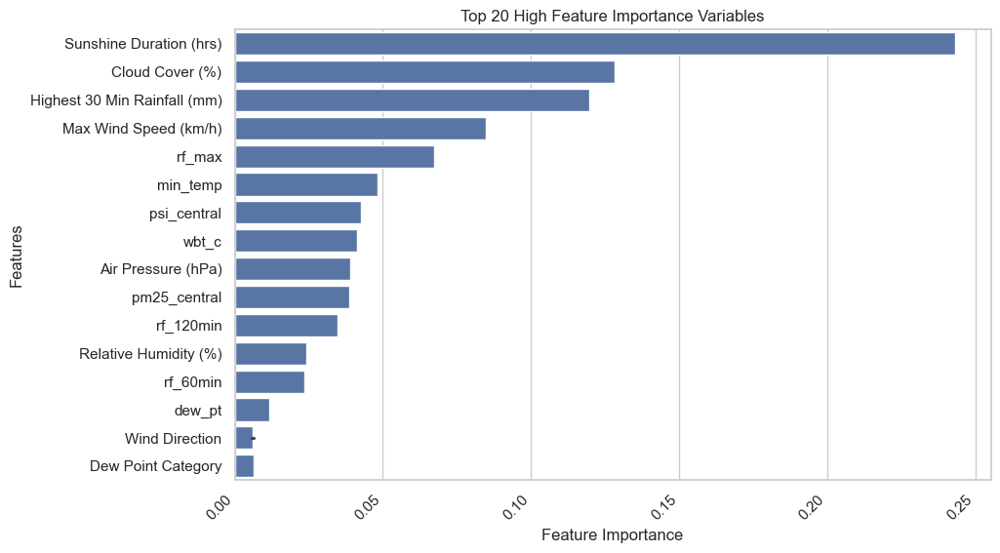

,Encoded Feature,Original Feature,Importance
0,Sunshine Duration (hrs),Sunshine Duration (hrs),0.243036
1,Cloud Cover (%),Cloud Cover (%),0.128214
2,Highest 30 Min Rainfall (mm),Highest 30 Min Rainfall (mm),0.119619
3,Max Wind Speed (km/h),Max Wind Speed (km/h),0.084857
4,rf_max,rf_max,0.067366
5,min_temp,min_temp,0.048267
6,psi_central,psi_central,0.042705
7,wbt_c,wbt_c,0.041368
8,Air Pressure (hPa),Air Pressure (hPa),0.038994
9,pm25_central,pm25_central,0.038532


In [72]:
# Plot Top 10 High Importance Features
rf_selector.plot_high_importance_features(n_features=20)

## Summary of Exploratory Data Analysis (EDA)

#### Quality of Data
The datasets regarding weather and air quality for the purpose of predicting solar panel efficiency required significant cleaning and preprocessing. The data contained missing values and placeholder symbols (e.g., '-' and '--'), which were uniformly converted to NaNs for consistent handling. Certain features like dates were in string format and were converted to Python's datetime format to facilitate time-based analysis.

#### Data Cleaning and Feature Engineering
**Data Cleaning:**
The script thoroughly addresses missing data through methods like forward filling, which assumes data continuity day-over-day. Also, there are duplicated rows and blank rows of data that are also cleaned in the script.

**Feature Engineering**:   
New features were derived from existing data to better capture the dynamics affecting solar panel efficiency:

- **Rainfall Features**:   
Calculated 'max_daily_rainfall' to fill missing values and created features based on differences between various rainfall measurements. This was underpinned by the assumption that maximum daily readings might better reflect the potential for solar panel obstruction due to weather conditions.

- **Temperature Features**:   
Features like 'mean_temp' and 'temp_range' were computed to provide a more nuanced view of temperature fluctuations, which could impact panel efficiency.

- **Wind Features**:   
Average and range of wind speeds were calculated, as these can influence debris accumulation on panels.

**Feature Removal**:   
- Redundant or highly correlated features were removed to streamline the dataset and prevent multicollinearity. For example, original temperature readings were dropped in favor of engineered features like 'mean_temp' and 'temp_range'.

#### Insights from Correlation and Time Series Analysis
**Correlation Analysis**:
- Initial analysis showed varied degrees of correlation between weather/air quality features and solar panel efficiency. Temperature and rainfall showed stronger correlations, suggesting a more direct impact on efficiency levels.

- Features with weak correlations were flagged for potential removal to improve model performance.

**Time Series Analysis**:
- The data exhibited seasonality and trends, important for forecasting models. For instance, rainfall and temperature showed clear seasonal patterns, which are crucial for predicting efficiency fluctuations.

- Stationarity tests indicated that some features required differencing to make them suitable for time-series forecasting, highlighting the dynamic nature of the environmental factors impacting solar panel efficiency.

#### Feature Selection
**Correlation-Based Selection**:
- Features were prioritized based on their correlation strength with the target variable. This step helped in identifying predictors likely to have a significant impact on the model.

**Random Forest for Feature Selection**:
- A Random Forest classifier was employed to assess feature importance, providing a non-linear perspective on feature relevance. This method confirmed some of the insights from the correlation analysis and further refined the feature set by highlighting the most impactful predictors.

- This approach also offered the advantage of handling categorical data and nonlinear relationships without the need for prior transformation, making it particularly valuable for complex datasets.

### Salient Points and Key Insights
- **Rainfall and Temperature**:   
These were identified as critical factors, with new features engineered around them showing significant predictive power.

- **Seasonality and Trends**:   
The acknowledgment and handling of these aspects in time series data were crucial for preparing the dataset for accurate predictive modeling.

- **Feature Reduction**:   
Both statistical techniques and machine learning models helped in effectively reducing the feature space, thus simplifying the model without sacrificing accuracy.

- **Predictive Power of Environmental Factors**:   
The analysis highlighted how various environmental factors interplay to affect solar panel efficiency, providing a solid foundation for building predictive models.

This EDA provided a comprehensive understanding of the factors influencing solar panel efficiency and established a robust framework for predictive modeling, combining classical statistical methods with advanced machine learning techniques.

### List of Features Dropped

1. **Redundant Rainfall Measurements**:
   - **`Highest 60 Min Rainfall (mm)`**
   - **`Highest 120 Min Rainfall (mm)`**
   - **`Daily Rainfall Total (mm)`**
   These features were dropped after creating new features that captured the maximum and differential aspects of rainfall, reducing redundancy and focusing on more informative measures.

2. **Original Temperature Features**:
   - **`Min Temperature (deg C)`**
   - **`Maximum Temperature (deg C)`**
   - **`mean_temp`**
   These were removed after creating the `temp_range` and `min_temp` feature, which provided a consolidated view of daily temperature variability, deemed more relevant for predicting solar panel efficiency.

3. **Less Informative Wind Speed Features**:
   - **`mean_wind speed`**
   - **`Min Wind Speed (km/h)`**
   After detailed analysis, these were considered less impactful compared to `Max Wind Speed (km/h)`, which was retained due to its higher correlation with the target variable.

4. **Air Quality Measures**:
   - Various specific location-based PM25 and PSI features like **`pm25_north`**, **`pm25_east`**, **`pm25_west`**, **`pm25_south`**, **`psi_north`**, **`psi_west`**, **`psi_east`**, and **`psi_south`**.
   These were removed in favor of central location measures (**`pm25_central`** and **`psi_central`**), which were more relevant to the location of the solar panels and showed stronger correlations with panel efficiency.

5. **Miscellaneous Features**:
   - **`Wet Bulb Temperature (deg F)`** and other lesser variants of temperature and humidity measurements were dropped due to either redundancy or low impact on the target variable after thorough statistical testing and analysis.

### Rationale Behind Feature Removal
The decision to remove these features was driven by a desire to simplify the model, reduce overfitting, and improve model performance. By focusing on the most impactful variables, the analysis aimed to enhance both the interpretability and accuracy of the predictive model. This approach also helps in managing computational efficiency by reducing the dimensionality of the data, which can be particularly beneficial when scaling the model or applying it to real-time data streams.

In summary, the features removed were largely those that either provided redundant information after the creation of more descriptive composite features or did not contribute significantly to understanding or predicting solar panel efficiency.

### List of New Features Created

1. **Rainfall-Related Features**:

   - **`max_daily_rainfall`**:   
   This feature captures the maximum rainfall recorded from multiple rainfall measures on a given day. It's designed to provide a comprehensive view of the most extreme weather conditions experienced, which can be critical for predicting efficiency on particularly adverse days.

   - **`rf_60min`**:   
   Difference between the `Highest 60 Min Rainfall (mm)` and `Highest 30 Min Rainfall (mm)`. This feature highlights the intensity of short-duration rainfall, which might affect the panels more significantly than prolonged lighter rain.

   - **`rf_120min`**:   
   Difference between the `Highest 120 Min Rainfall (mm)` and `Highest 30 Min Rainfall (mm)`. It provides insights into the escalation of rainfall over two hours, offering a nuanced understanding of rainfall patterns.

   - **`rf_max`**:   
   Difference between `max_daily_rainfall` and `Highest 30 Min Rainfall (mm)`, providing a measure of daily rainfall variability, which can indicate days with fluctuating weather conditions.

2. **Temperature-Related Features**:

   - **`mean_temp`**:   
   Average of `Min Temperature (deg C)` and `Max Temperature (deg C)`. This feature represents the average daily temperature, giving a more stable measure of daily thermal conditions.

   - **`temp_range`**:   
   Difference between `Max Temperature (deg C)` and `Min Temperature (deg C)`. This feature reflects the daily temperature fluctuation, which can influence solar panel efficiency through thermal dynamics.

   - **`min_temp`** and **`max_temp`**:   
   These features correct any anomalies where the maximum recorded temperature of the day is lower than the minimum (due to errors or sensor issues), ensuring a logical range of temperature is maintained.

3. **Wind-Related Features**:

   - **`mean_wind_speed`**:   
   Average of `Min Wind Speed (km/h)` and `Max Wind Speed (km/h)`. This feature offers a balanced view of wind conditions, which can affect debris accumulation on solar panels.

4. **Humidity and Dew Point**:  
   - **`dew_pt`**:   
   An ordinal encoding of the `Dew Point Category`, which provides a scaled measure of moisture content in the air, relevant for understanding conditions that might affect panel efficiency through dew formation or frosting.

5. **Differenced Features**:
   - Differenced features, with suffix "_diff" provides "stationary" time series features with reduced or eliminated time-dependent structures like trends and seasonality. The main idea is to have stabilized the mean of the time series by removing changes in the level of a time series, thereby stabilizing variance as well.

### Rationale Behind Feature Creation

These features were strategically designed to better quantify environmental variables that directly or indirectly affect solar panel performance. By creating these features, the analysis aimed to:

- **Enhance Model Accuracy**:   
Providing the model with detailed variables that capture the essence of the weather and environmental conditions more effectively.

- **Reduce Complexity**:   
Instead of using raw data, these engineered features simplify the input space by encapsulating critical information into more relevant metrics.

- **Improve Predictability**:   
By transforming raw data into features that more closely reflect the operational impact on solar panels, the predictive models can make more accurate forecasts.

These new features likely provide more control variables and interaction terms for the models, allowing for more sophisticated and nuanced understanding and prediction of solar panel efficiency.